<a href="https://colab.research.google.com/github/ChickenRob0t/Proyecto-Covid-Meteorologia/blob/main/SS_Unido.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

## En esta parte del código, se unen los datos antes proveidos para generar gráficos y estadísticos.
Esto con el fin de encontrar si existe una relación entre las variables metereológicas y los casos de COVID.

In [ ]:
import numpy as np
import matplotlib.pyplot as plt
import pandas as pd
import matplotlib.dates as mdates

In [ ]:
from google.colab import files

In [ ]:
#Cargamos ambos programas dentro de este para poder utilizar los dataframes generados en los programas anteriores
!cp /content/drive/MyDrive/Datos\ S.S/Data/s_s_2.py /content
!cp /content/drive/MyDrive/Datos\ S.S/Data/s_s_clima.py /content
!cp /content/drive/MyDrive/Datos\ S.S/Data/s_s_climax.py /content

In [ ]:
import s_s_2
#Para resumir, de este colab lo que está rescatable es:
#Estaciones_count[n] n va de 0 a 8, y su diccionario Estaciones_D
#Count_days el dataframe con todos los datos de contagios


import s_s_climax as s_s_clima
#Aquí sirve el conag_esp[n] con n de 0-4 y su respectivo diccionario Conagua_dict
#Además de Maximos_Estaciones[n] con n 0-4 y su diccionario Esta_dict

In [ ]:
#Ahora sólo falta poner una encima de la otra para ver si existen datos parecidos.
print(s_s_2.Estaciones_D)
print(s_s_clima.Conagua_dict)
print(s_s_clima.Esta_dict)
#Cargamos las bases de datos con nombres
Conagua_clima=s_s_clima.conag_esp
Otras_clima=s_s_clima.Maximos_Estaciones
Contagios_est=s_s_2.Estaciones_count

{'UAG': 0, 'Experiencia': 1, 'Prepa 20': 2, 'Molinos': 3, 'IAM': 4, 'Guadalajara': 5, 'Tlaquepaque': 6, 'Zapopan': 7, 'Tonala': 8}
{0: 'ACATLAN DE JUAREZ, ACATL', 1: 'GUADALAJARA (DGE), GUADA', 2: 'TLAQUEPAQUE, TLAQUEPAQUE', 3: 'ZAPOPAN, ZAPOPAN', 4: 'TONALA, TONALA'}
{0: 'UAG_2021', 1: 'Tet_20', 2: 'Prep_2021', 3: 'Moli_2021', 4: 'Iam_2021'}


In [ ]:
#len(Otras_clima)

In [ ]:
#Eliminamos los datos de Acatlán y unimos las bases de datos en una lista
Conagua_climas=Conagua_clima[1:]
Clima_completo=Otras_clima+Conagua_climas


In [ ]:
#En el dataframe 7 hay unos problemas, existen fechas que realmente no existen en el calendario cx, esto nos genera un problema en lo que sigue
Clima_completo[7].drop(Clima_completo[7][Clima_completo[7]['Date']=='2020-6-31'].index , inplace=True)

Clima_completo[7].drop(Clima_completo[7][Clima_completo[7]['Date']=='2020-9-31'].index , inplace=True)

Clima_completo[7].drop(Clima_completo[7][Clima_completo[7]['Date']=='2020-11-31'].index , inplace=True)


#Contagios_est=list(map(lambda x: x.rename({'FECINGRE':'Date'}, axis=1,inplace=True),Contagios_est))
#Me cambiaron de la columna 7 a la 8 con ese problema xd
#Aveces el 'Date' de Estaciones count no aparece, sino aparece FECINGRE, quitarle el gato al código de arriba

In [ ]:
def date(x):
  x['Date']=pd.to_datetime(x['Date'])
  return x


Clima_completo[5:]=list(map( date ,  Clima_completo[5:] ))  #Ahora todos están en formato datetime (recordar que esto lo podría hacer en el programa de climas)

In [ ]:
Complete_df=[]
for i in range(len(Contagios_est)):
  aux=pd.DataFrame()
  Complete_df.append( pd.merge(Clima_completo[i],Contagios_est[i],'right','Date').fillna(0) )

#Recordar que los dataframes del 0-->4 están muy pobres en datos del clima :(, ver el diccionario s_s_clima.dias cuántos aparecen

In [ ]:
Conagua_est=['GUADALAJARA (DGE), GUADA','TLAQUEPAQUE, TLAQUEPAQUE','ZAPOPAN, ZAPOPAN','TONALA, TONALA']

Estaciones_str_compl= s_s_clima.Esta_str+Conagua_est


In [ ]:
Estaciones_str_compl

['UAG_2021',
 'Tet_20',
 'Prep_2021',
 'Moli_2021',
 'Iam_2021',
 'GUADALAJARA (DGE), GUADA',
 'TLAQUEPAQUE, TLAQUEPAQUE',
 'ZAPOPAN, ZAPOPAN',
 'TONALA, TONALA']

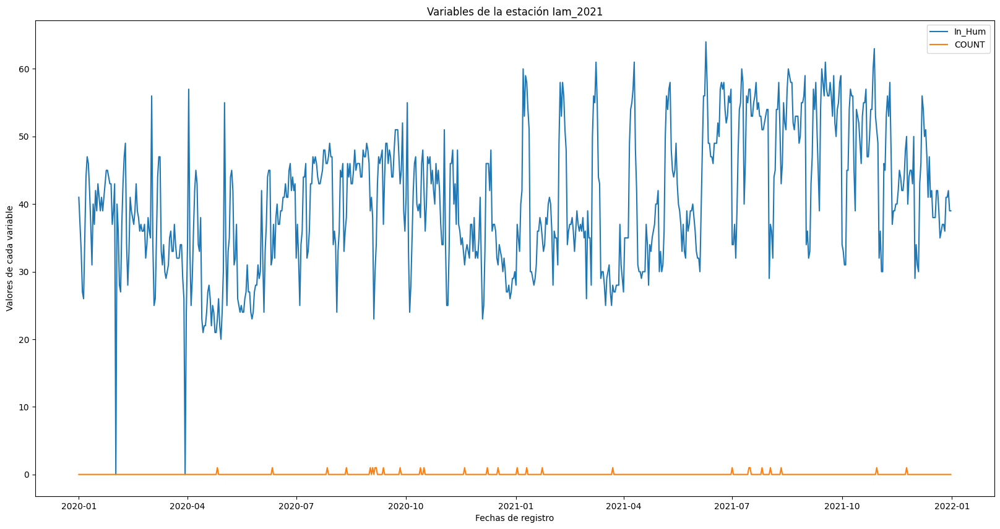

In [ ]:
#Como las variables de las estaciones de Conagua son distintas a las de las demás, de la estación 5 hacia delante son del Conagua
est=4

columnas=Complete_df[est].columns[[2,-1]]  #Aquí si cambia los valores, ve la columna que le indique, en este caso, la 3 y la 5

fig, ax = plt.subplots(figsize=(20,10))

# Plotear el DataFrame
ax.plot(Complete_df[est]['Date'], Complete_df[est][columnas])


plt.xlabel('Fechas de registro')
plt.ylabel('Valores de cada variable')
plt.title('Variables de la estación '+ str(Estaciones_str_compl[est]))
plt.legend(columnas)

plt.show()


#Normalizamos los dataframes para intentar que se vean más directas si existen correlaciones entre las variables y la cantidad de personas infectadas

In [ ]:
#Crear función en la que saque los valores media y desv estándar sin contar los ceros de cada fila y luego normalizar cada columna esto podría ser con un for sobre todas las columnas

#mean = df['col1'][df['col1']!=0].mean()
#std = df['col1'][df['col1']!=0].std()

In [ ]:
def min_max(x):
  y=x.iloc[:,1:]
  y= (y-y.min() )/(y.max()-y.min())
  y.insert(0,'Date',x['Date'])
  return y

Df_com_norm=list(map(min_max,Complete_df))


In [ ]:
#Como no se ve tan bien, y no se alcanza a apreciar si existen desfases, re-escalamos las variables menos los contagios
def rescala(x):
  x.iloc[:,1:-1]=x.iloc[:,1:-1]*4
  return x

Df_rescalado=list(map(rescala, Df_com_norm))


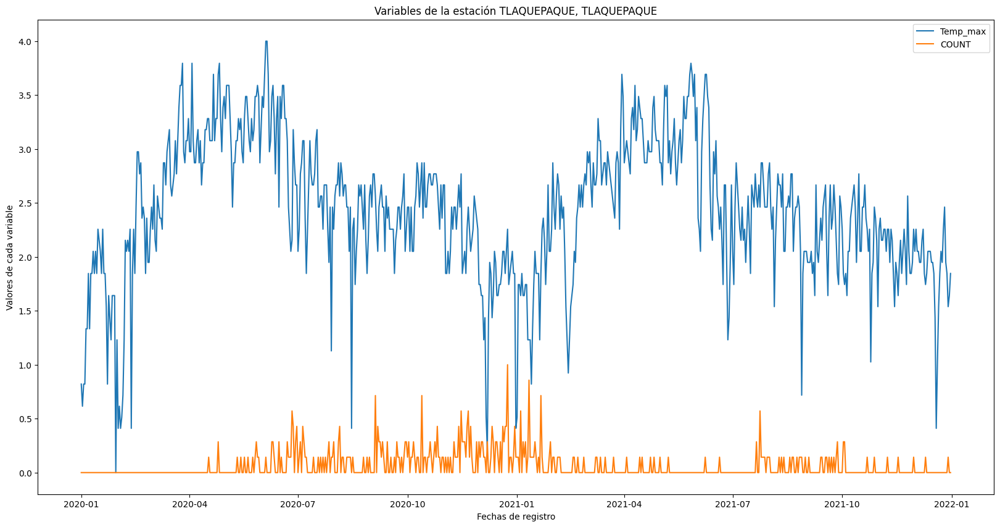

In [ ]:
#Como las variables de las estaciones de Conagua son distintas a las de las demás, de la estación 5 hacia delante son del Conagua
est=6


columnas=Df_rescalado[est].columns[[2,-1]]  #Aquí si cambia los valores, ve la columna que le indique, en este caso, la 3 y la 5



fig, ax = plt.subplots(figsize=(20,10))

# Plotear el DataFrame
ax.plot(Df_rescalado[est]['Date'], Df_rescalado[est][columnas])

plt.xlabel('Fechas de registro')
plt.ylabel('Valores de cada variable')
plt.title('Variables de la estación '+ str(Estaciones_str_compl[est]))
plt.legend(columnas)
plt.show()



<ipython-input-47-89e12226f7de>:12: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`). Consider using `matplotlib.pyplot.close()`.
  fig, ax = plt.subplots(figsize=(20,10))


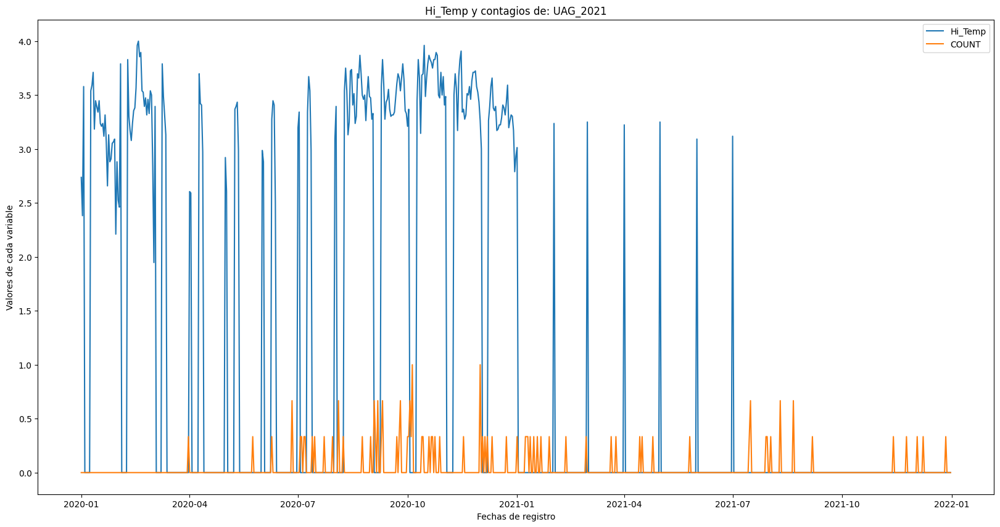

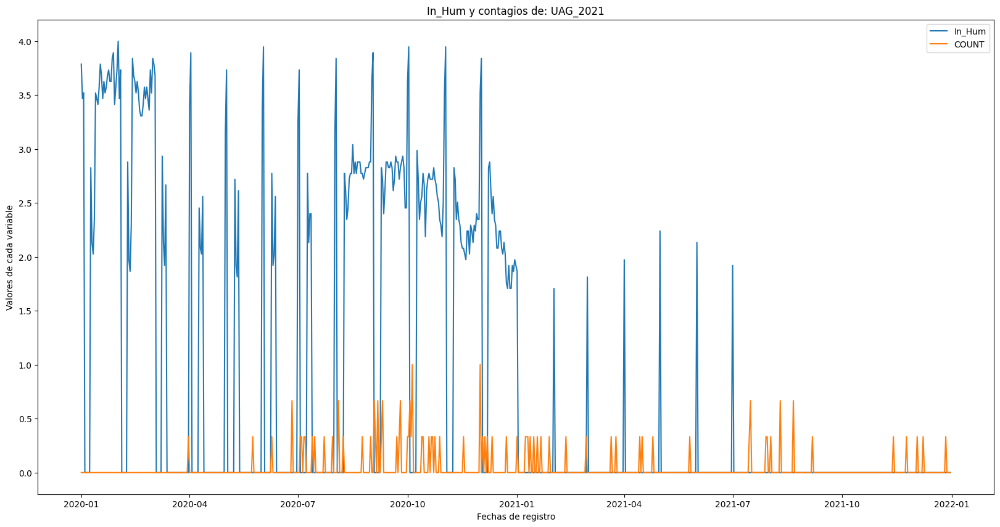

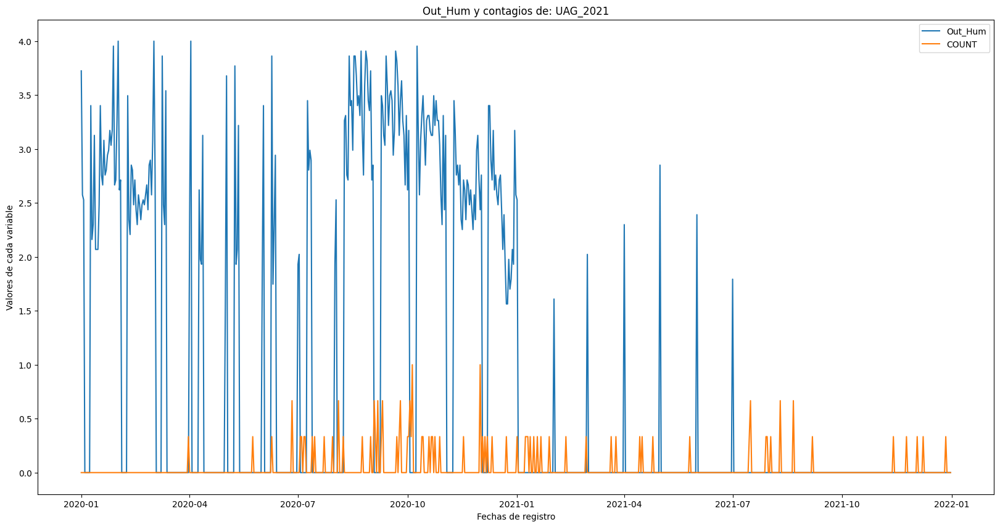

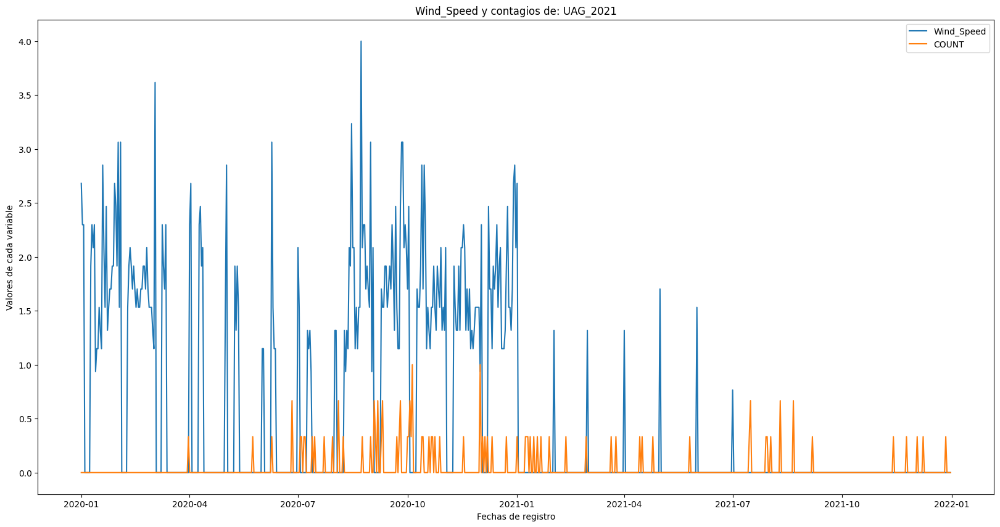

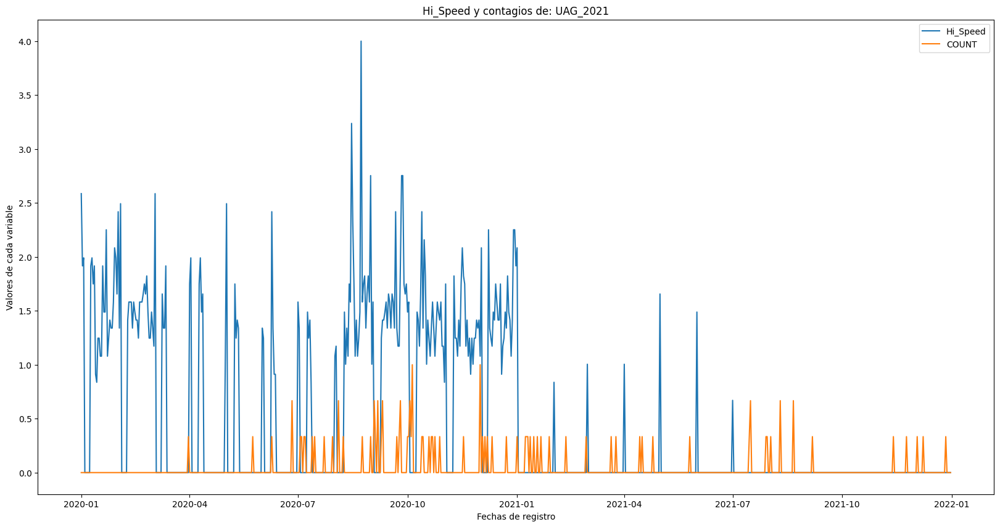

...

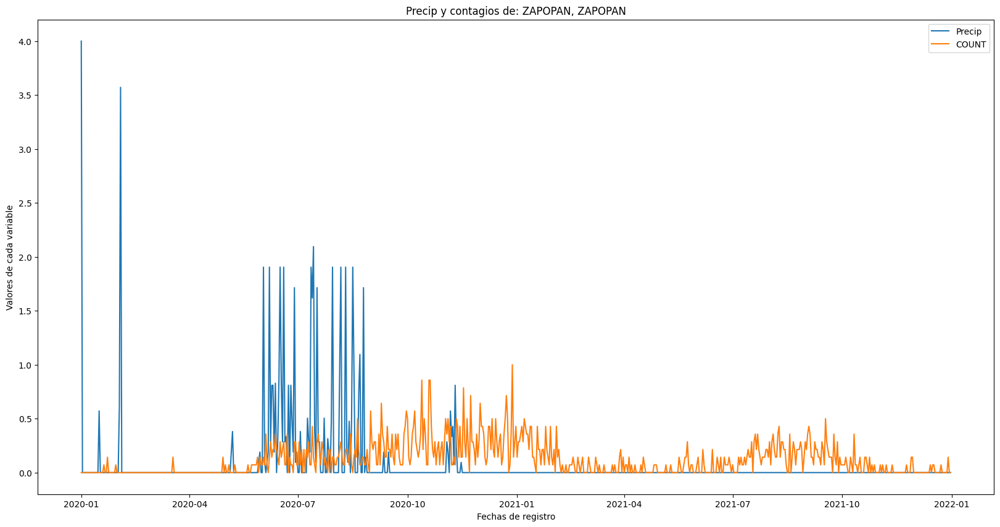

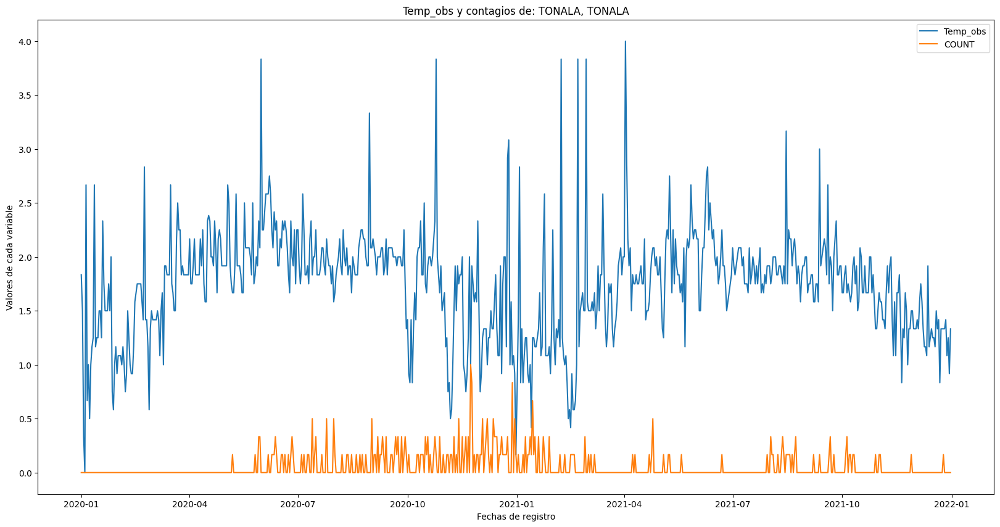

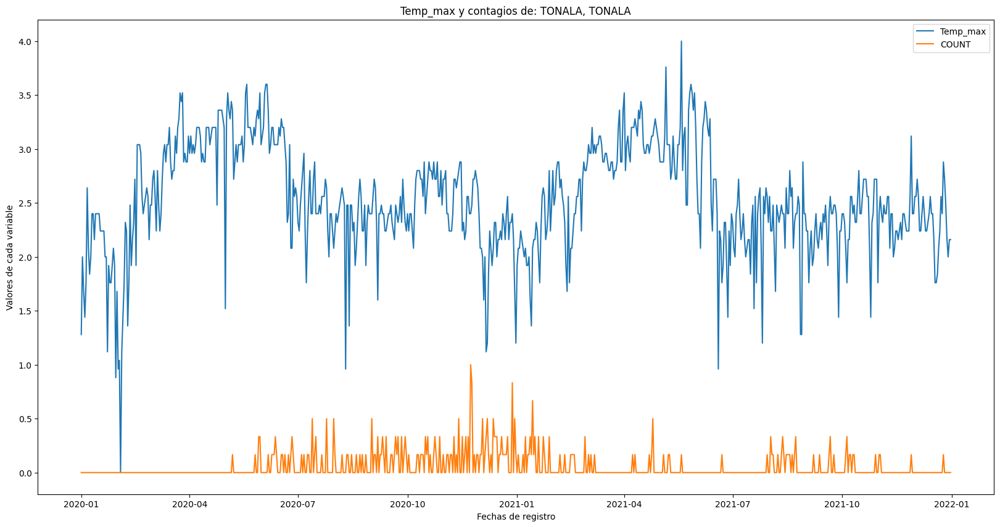

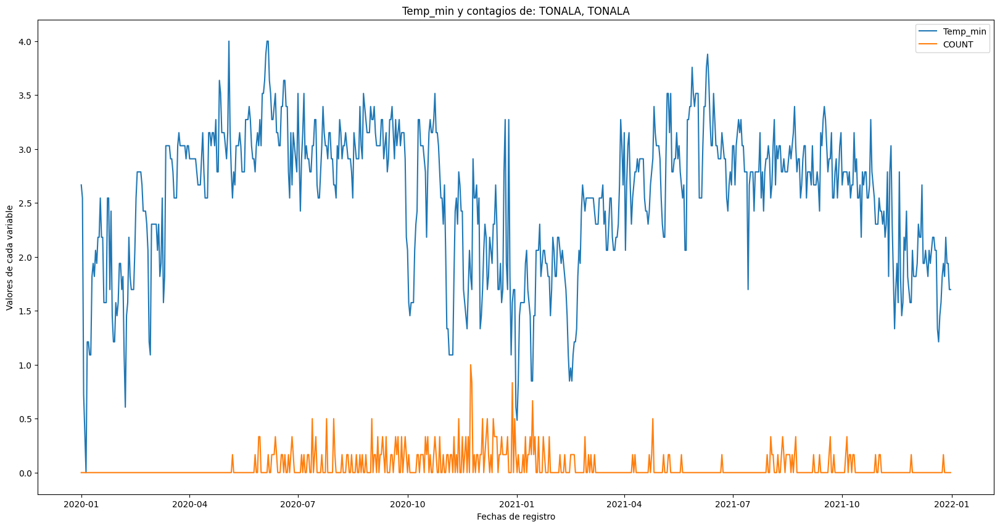

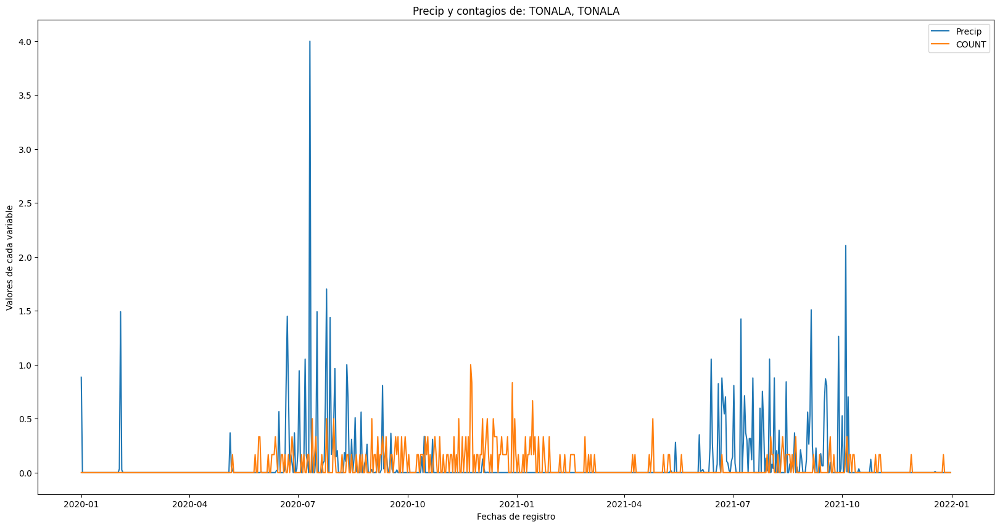

In [ ]:
#Este es para sacar las imágenes de contagios y una variable (Si quiere esta no la ejecute, sólo le cargará las imágenes de cada una de las gráficas que ya le mandé)
for i in range(len(Estaciones_str_compl)):
  est=i

  for j in range(1, len(Df_rescalado[i].columns[1:]) ):


    columnas=Df_rescalado[i].columns[[j,-1]]  #Aquí si cambia los valores, ve la columna que le indique, en este caso, la 3 y la 5



    fig, ax = plt.subplots(figsize=(20,10))

    # Plotear el DataFrame
    ax.plot(Df_rescalado[i]['Date'], Df_rescalado[i][columnas])

    plt.xlabel('Fechas de registro')
    plt.ylabel('Valores de cada variable')
    plt.title( str(columnas[0])+' y '+'contagios de: '+ str(Estaciones_str_compl[i]))
    plt.legend(columnas)
    plt.savefig(str(Estaciones_str_compl[i])+'_'+str(columnas[0])+'.png', dpi=200)


## *Aquí buscaremos las qué tan relacionadas están las variables*

In [ ]:
from sklearn.metrics import mutual_info_score
from sklearn.feature_selection import mutual_info_regression
import statsmodels.api as sm
from sklearn.metrics import mean_squared_error

In [ ]:
#Estos primeros 3 dataframes es para ver las correlaciones que existen entre las variables (la última es el número de contagios)
Complete_df[0].corr(method='pearson')

<ipython-input-49-3092de1f142d>:2: FutureWarning: The default value of numeric_only in DataFrame.corr is deprecated. In a future version, it will default to False. Select only valid columns or specify the value of numeric_only to silence this warning.
  Complete_df[0].corr(method='pearson')


,Hi_Temp,In_Hum,Out_Hum,Wind_Speed,Hi_Speed,Solar_Rad,COUNT
Hi_Temp,1.000000,0.953281,0.967173,0.932105,0.938009,0.979348,0.014805
In_Hum,0.953281,1.000000,0.959500,0.919694,0.924554,0.948107,0.006398
Out_Hum,0.967173,0.959500,1.000000,0.935060,0.942743,0.967955,0.019939
Wind_Speed,0.932105,0.919694,0.935060,1.000000,0.990821,0.931860,0.009516
Hi_Speed,0.938009,0.924554,0.942743,0.990821,1.000000,0.937068,0.007524
Solar_Rad,0.979348,0.948107,0.967955,0.931860,0.937068,1.000000,0.014807
COUNT,0.014805,0.006398,0.019939,0.009516,0.007524,0.014807,1.000000


In [ ]:
Complete_df[0].corr(method='spearman')

<ipython-input-50-991ba1581257>:1: FutureWarning: The default value of numeric_only in DataFrame.corr is deprecated. In a future version, it will default to False. Select only valid columns or specify the value of numeric_only to silence this warning.
  Complete_df[0].corr(method='spearman')


,Hi_Temp,In_Hum,Out_Hum,Wind_Speed,Hi_Speed,Solar_Rad,COUNT
Hi_Temp,1.000000,0.957112,0.966716,0.959198,0.960302,0.974327,0.025994
In_Hum,0.957112,1.000000,0.976410,0.965996,0.966556,0.972353,0.006331
Out_Hum,0.966716,0.976410,1.000000,0.970027,0.971141,0.980781,0.023412
Wind_Speed,0.959198,0.965996,0.970027,1.000000,0.996323,0.971682,0.012190
Hi_Speed,0.960302,0.966556,0.971141,0.996323,1.000000,0.972973,0.008632
Solar_Rad,0.974327,0.972353,0.980781,0.971682,0.972973,1.000000,0.017562
COUNT,0.025994,0.006331,0.023412,0.012190,0.008632,0.017562,1.000000


<ipython-input-66-d74e4865c537>:1: FutureWarning: The default value of numeric_only in DataFrame.corr is deprecated. In a future version, it will default to False. Select only valid columns or specify the value of numeric_only to silence this warning.
  cor=Complete_df[0].corr(method='kendall')


([<matplotlib.axis.YTick at 0x7fad583d1780>,
 [Text(0, 0, 'Date'),
  Text(0, 1, 'Hi_Temp'),
  Text(0, 2, 'In_Hum'),
  Text(0, 3, 'Out_Hum'),
  Text(0, 4, 'Wind_Speed'),
  Text(0, 5, 'Hi_Speed'),
  Text(0, 6, 'Solar_Rad'),
  Text(0, 7, 'COUNT')])

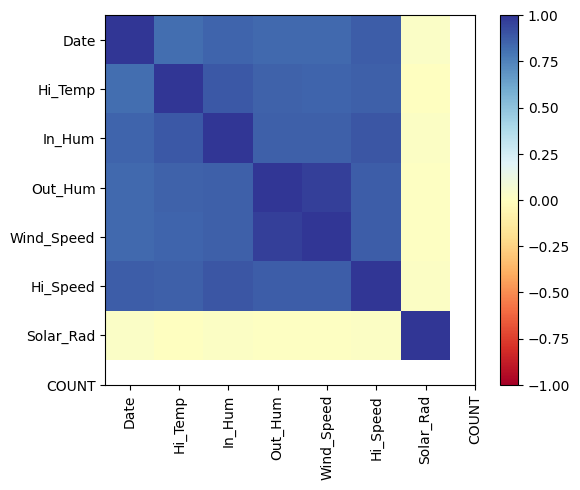

In [ ]:
cor=Complete_df[0].corr(method='kendall')
columnas=list(Complete_df[0].columns)

plt.imshow(cor, cmap='RdYlBu', vmin=-1, vmax=1)
plt.colorbar()


plt.xticks(range(len(columnas)),columnas, rotation=90)
plt.yticks(range(len(columnas)), columnas)

##Código para ver la relación entre las variables y los contagios
Podemos cambiando la i a un valor entre 0 y 9 ver la relación entre las variables de interés y los contagios, cada columna entrega un coeficiente diferente (aquí también está la varianza)

In [ ]:
#Genera un DataFrame para cada estación con los coeficientes de interés (Varianza, R^2,...,etc)
i=0
colum=Complete_df[i].columns

R__2=[]
R__2ad=[]
F__S=[]
P__=[]
MSE__=[]
Var=[]


for vari in range(1,len(colum)-1):

  y=Complete_df[i].iloc[:,-1]
  x=sm.add_constant(Complete_df[i].iloc[:,vari])                #Generamos el modelo de regresión lineal con los contagios
  model=sm.OLS(y,x).fit()

  R__2.append( model.rsquared )
  R__2ad.append(model.rsquared_adj )
  MSE__.append(mean_squared_error(model.predict(x), y ) )      #Agregamos cada uno de los valores a un array que será columna en la tabla
  F__S.append(model.fvalue)
  P__.append(model.f_pvalue)
  Var.append( Complete_df[i].iloc[:,vari].var() )

pearson=Complete_df[i].corr(method='pearson')['COUNT'][:-1]
spearman=Complete_df[i].corr(method='spearman')['COUNT'][:-1]      #Valores de correlaciones entre las variables y contagios
kendall=Complete_df[i].corr(method='kendall')['COUNT'][:-1]

Correlations=pd.DataFrame({'Varianza': Var, 'R_2': R__2, 'R_2-Ajustado': R__2ad, 'MSE': MSE__, 'F-Stad':F__S, 'P-Valor': P__ , 'Pearson': pearson, 'Spearman': spearman, 'Kendall': kendall})
print('Para la estación: ' + str(Estaciones_str_compl[i]))
Correlations

Para la estación: UAG_2021


<ipython-input-52-dd89394b6b1a>:26: FutureWarning: The default value of numeric_only in DataFrame.corr is deprecated. In a future version, it will default to False. Select only valid columns or specify the value of numeric_only to silence this warning.
  pearson=Complete_df[i].corr(method='pearson')['COUNT'][:-1]
<ipython-input-52-dd89394b6b1a>:27: FutureWarning: The default value of numeric_only in DataFrame.corr is deprecated. In a future version, it will default to False. Select only valid columns or specify the value of numeric_only to silence this warning.
  spearman=Complete_df[i].corr(method='spearman')['COUNT'][:-1]      #Valores de correlaciones entre las variables y contagios
<ipython-input-52-dd89394b6b1a>:28: FutureWarning: The default value of numeric_only in DataFrame.corr is deprecated. In a future version, it will default to False. Select only valid columns or specify the value of numeric_only to silence this warning.
  kendall=Complete_df[i].corr(method='kendall')['COU

,Varianza,R_2,R_2-Ajustado,MSE,F-Stad,P-Valor,Pearson,Spearman,Kendall
Hi_Temp,138.036924,0.000219,-0.001152,0.148594,0.159828,0.689432,0.014805,0.025994,0.024080
In_Hum,604.159129,0.000041,-0.001331,0.148620,0.029845,0.862891,0.006398,0.006331,0.005925
Out_Hum,853.244859,0.000398,-0.000974,0.148567,0.289950,0.590417,0.019939,0.023412,0.021731
Wind_Speed,4.140487,0.000091,-0.001281,0.148613,0.066015,0.797303,0.009516,0.012190,0.011354
Hi_Speed,15.715364,0.000057,-0.001315,0.148618,0.041270,0.839074,0.007524,0.008632,0.007994
Solar_Rad,161148.090149,0.000219,-0.001152,0.148594,0.159856,0.689407,0.014807,0.017562,0.016242


In [ ]:
Estaciones_str_compl

['UAG_2021',
 'Tet_20',
 'Prep_2021',
 'Moli_2021',
 'Iam_2021',
 'GUADALAJARA (DGE), GUADA',
 'TLAQUEPAQUE, TLAQUEPAQUE',
 'ZAPOPAN, ZAPOPAN',
 'TONALA, TONALA']

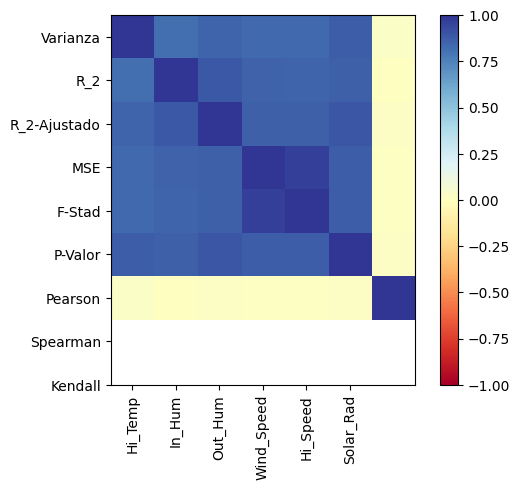

In [ ]:
columnas=list(Correlations.columns)
filas=list(Correlations.index.values)

plt.imshow(cor, cmap='RdYlBu', vmin=-1, vmax=1)
plt.colorbar()


plt.xticks(range(len(filas)),filas, rotation=90)
plt.yticks(range(len(columnas)), columnas)
plt.savefig('corryotras.png',dpi=200)

In [ ]:
Correlations.

,Varianza,R_2,R_2-Ajustado,MSE,F-Stad,P-Valor,Pearson,Spearman,Kendall
Hi_Temp,138.036924,0.000219,-0.001152,0.148594,0.159828,0.689432,0.014805,0.025994,0.024080
In_Hum,604.159129,0.000041,-0.001331,0.148620,0.029845,0.862891,0.006398,0.006331,0.005925
Out_Hum,853.244859,0.000398,-0.000974,0.148567,0.289950,0.590417,0.019939,0.023412,0.021731
Wind_Speed,4.140487,0.000091,-0.001281,0.148613,0.066015,0.797303,0.009516,0.012190,0.011354
Hi_Speed,15.715364,0.000057,-0.001315,0.148618,0.041270,0.839074,0.007524,0.008632,0.007994
Solar_Rad,161148.090149,0.000219,-0.001152,0.148594,0.159856,0.689407,0.014807,0.017562,0.016242
